In [1]:
import torch
import cv2
import numpy as np
from PIL import Image
import imageio
import sys
import os
sys.path.append("""/home/jonfrey/ASL/src""")
os.chdir("/home/jonfrey/ASL")
from pseudo_label import PseudoLabelLoader
from visu import Visualizer

scannet = '/home/jonfrey/datasets/scannet/'

In [2]:
from torchvision import transforms as tf

H,W = 640, 1280

def get_image(p, H=960, W=1280, scale=True):
    _crop_center = tf.CenterCrop((H,W))
    path = os.path.join( scannet , p ) 
    
    img = Image.open(path)    
    
    if scale:
        img = _crop_center( img )
    
    return np.array( img )

In [3]:
pll = PseudoLabelLoader(window_size=2, sub=1, ignore_depth=True, h=H,w=W )
visu = Visualizer(os.getenv('HOME')+'/tmp', logger=None, epoch=0, store=False, num_classes=41)
seg, depth, flow, paths = pll[0]

In [14]:
pll.global_to_local_idx

[{'seg_ids': [1, 0], 'flow_ids': [1, 0], 'depth_ids': []},
 {'seg_ids': [2, 1], 'flow_ids': [2, 1], 'depth_ids': []},
 {'seg_ids': [3, 2], 'flow_ids': [3, 2], 'depth_ids': []},
 {'seg_ids': [4, 3], 'flow_ids': [4, 3], 'depth_ids': []},
 {'seg_ids': [5, 4], 'flow_ids': [5, 4], 'depth_ids': []},
 {'seg_ids': [6, 5], 'flow_ids': [6, 5], 'depth_ids': []},
 {'seg_ids': [7, 6], 'flow_ids': [7, 6], 'depth_ids': []},
 {'seg_ids': [8, 7], 'flow_ids': [8, 7], 'depth_ids': []},
 {'seg_ids': [9, 8], 'flow_ids': [9, 8], 'depth_ids': []},
 {'seg_ids': [10, 9], 'flow_ids': [10, 9], 'depth_ids': []},
 {'seg_ids': [11, 10], 'flow_ids': [11, 10], 'depth_ids': []},
 {'seg_ids': [12, 11], 'flow_ids': [12, 11], 'depth_ids': []},
 {'seg_ids': [13, 12], 'flow_ids': [13, 12], 'depth_ids': []},
 {'seg_ids': [14, 13], 'flow_ids': [14, 13], 'depth_ids': []},
 {'seg_ids': [15, 14], 'flow_ids': [15, 14], 'depth_ids': []},
 {'seg_ids': [16, 15], 'flow_ids': [16, 15], 'depth_ids': []},
 {'seg_ids': [17, 16], 'flow_i

In [4]:
import numpy as np
import cv2 as cv

def compute_flow(frame1, frame2):
    
    prvs = cv.cvtColor(frame1,cv.COLOR_BGR2GRAY)
    hsv = np.zeros_like(frame1)
    hsv[...,1] = 255
    ne = cv.cvtColor(frame2,cv.COLOR_BGR2GRAY)
    flow = cv.calcOpticalFlowFarneback(prvs,ne, None, 0.5, 3, 15, 3, 5, 1.2, 0)
    mag, ang = cv.cartToPolar(flow[...,0], flow[...,1])
    hsv[...,0] = ang*180/np.pi/2
    hsv[...,2] = cv.normalize(mag,None,0,255,cv.NORM_MINMAX)
    bgr = cv.cvtColor(hsv,cv.COLOR_HSV2BGR)
#     display( Image.fromarray(bgr) )
#     print(flow.shape)
    return flow
    

def readFlowKITTI(filename):
    flow = cv2.imread(filename, cv2.IMREAD_ANYDEPTH|cv2.IMREAD_COLOR)
    flow = flow[:,:,::-1].astype(np.float32)
    flow, valid = flow[:, :, :2], flow[:, :, 2]
    flow = (flow - 2**15) / 64.0
    return flow, valid


['scans/scene0000_00/color/2.jpg', 'scans/scene0000_00/color/1.jpg']
(640, 1280, 3)
(640, 1280, 3)
(640, 1280, 2)
['scans/scene0000_00/color/2.jpg', 'scans/scene0000_00/color/1.jpg']


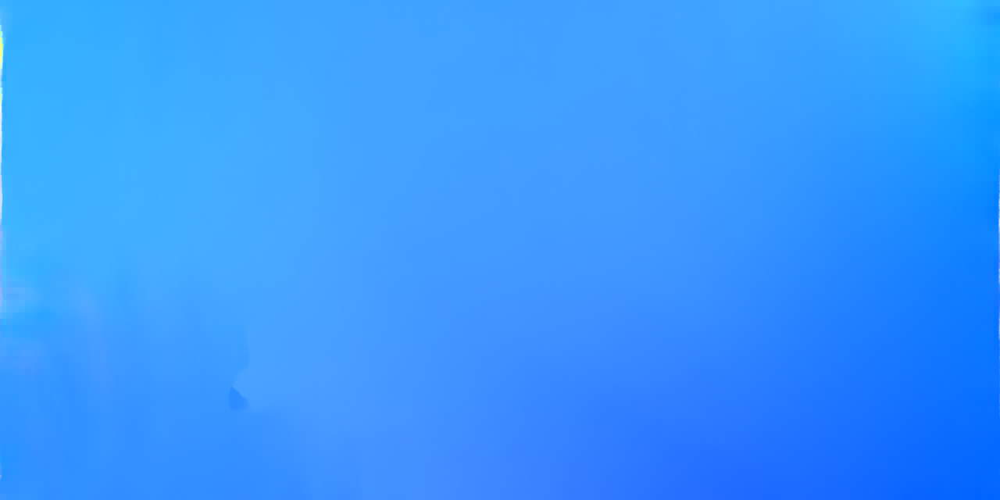

12.3125 -23.234375
Prev


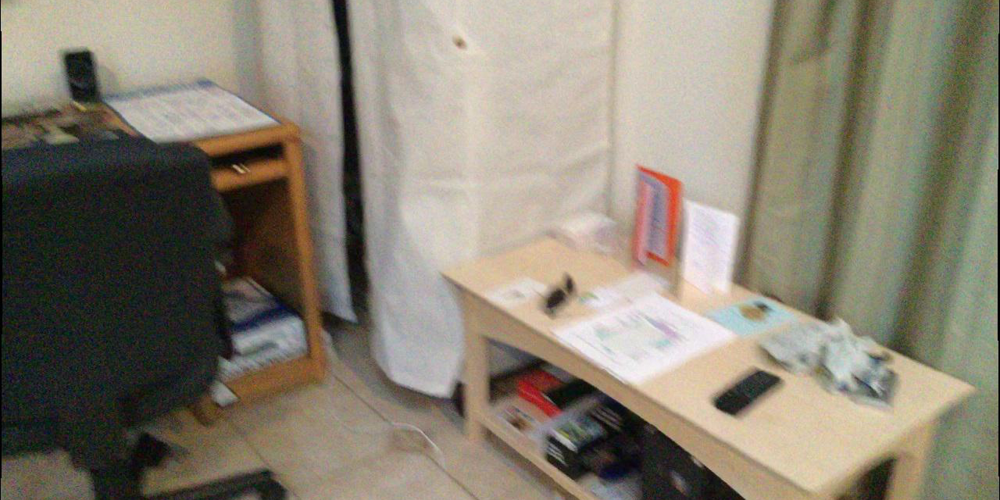

Next


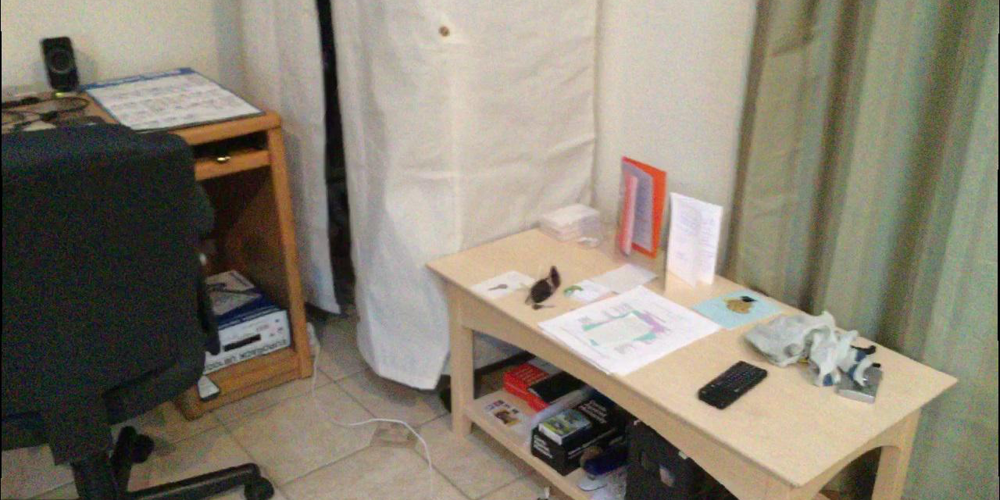

Forwarded Image


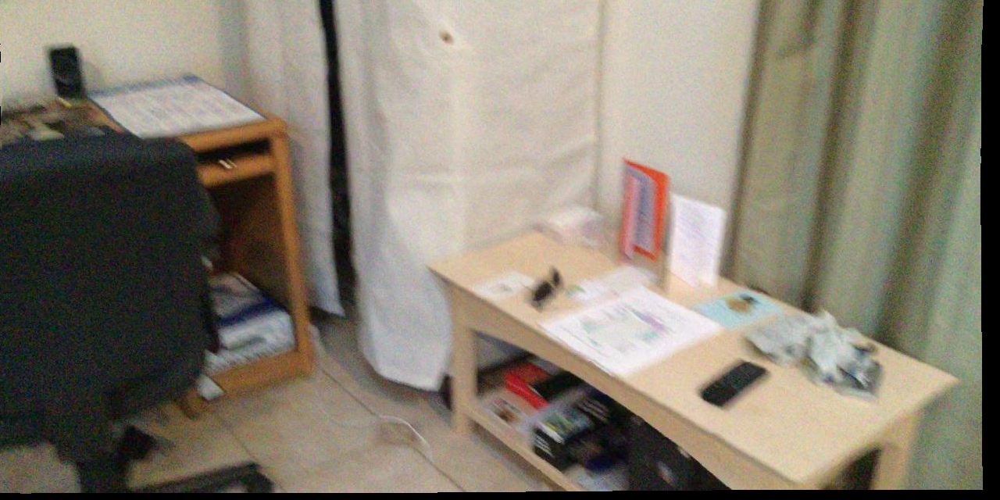

Image forwarded vs next


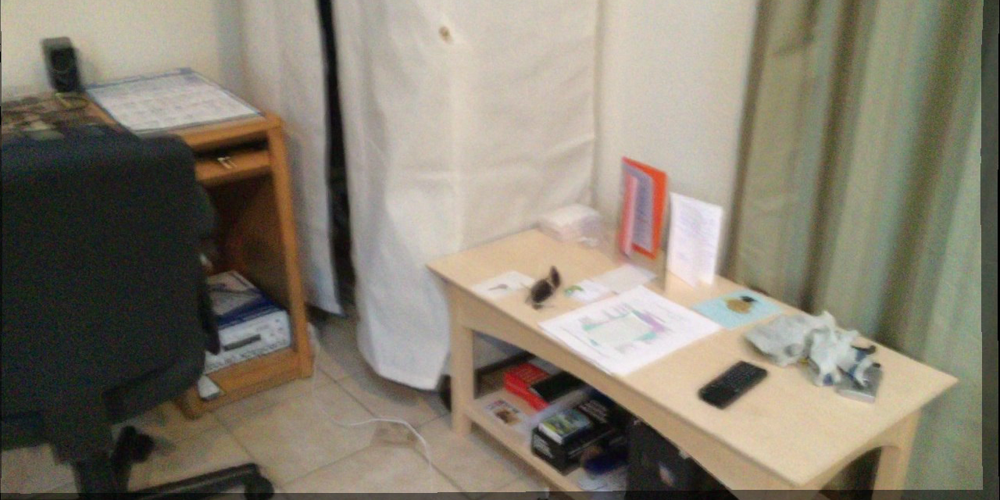

Prev and next


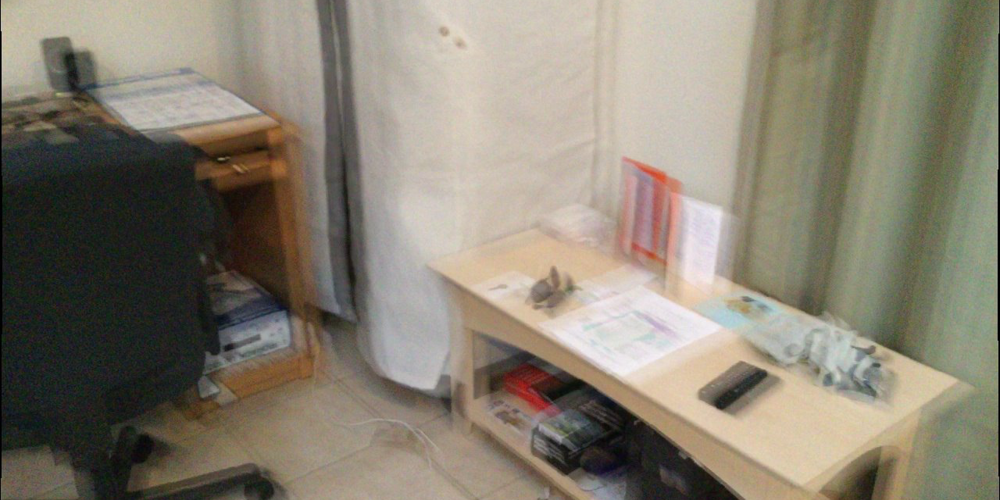

Prev and flow overlay


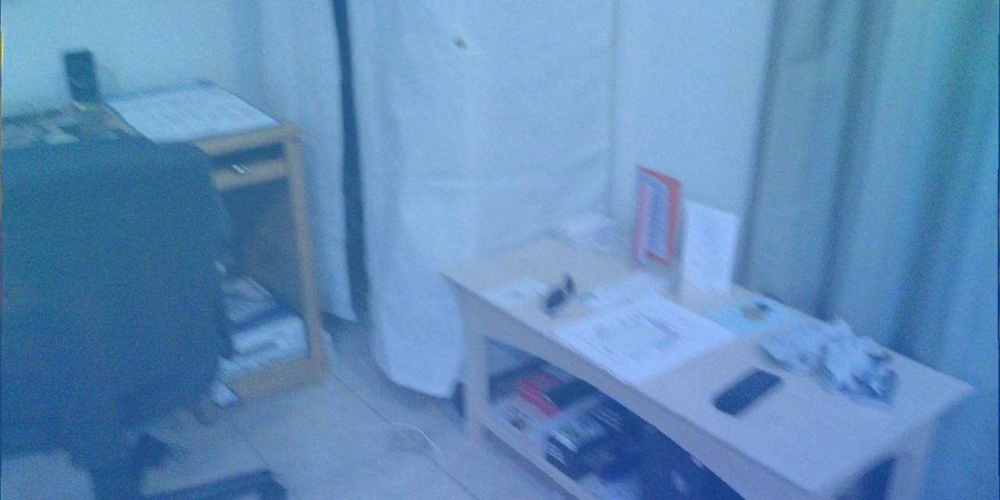

In [15]:
def load_and_visu(index, i):
    i = 0 # i=0 -> Image1    i=1 -> Image0
    
    H,W = 640, 1280
    seg, depth, flow, paths = pll[index]
    
#     seg_gt = seg[i][1]
#     seg_pred = seg[i][0]
#     seg_valid = seg[i][0]
#     depth_pred = depth[i]
    flow_pred = flow[i+1][0]
    
    if False:
        # LOAD KITTI
        f,v = readFlowKITTI("/home/jonfrey/datasets/kitti/training/flow_occ/000000_10.png") 
        flow_pred = f  
        paths[i] = "/home/jonfrey/datasets/kitti/training/image_2/000000_10.png"
        paths[i+1] = "/home/jonfrey/datasets/kitti/training/image_2/000000_11.png"
        imgs = [get_image(p,scale=False) for p in paths]
    elif False:
        f,v = readFlowKITTI("/home/jonfrey/RPOSE/demo-frames/flow0.png") 
        flow_pred = f  
        paths[i] ="/home/jonfrey/RPOSE/demo-frames/0.jpg"
        paths[i+1] = "/home/jonfrey/RPOSE/demo-frames/1.jpg"
        imgs = [get_image(p,H = 968, W=1296, scale=True) for p in paths]
        
    else:
        imgs = [get_image(p,H=H,W=W, scale=True) for p in paths]
        
        f,v = readFlowKITTI("/home/jonfrey/results/scannet_eval/run_24h_train_1gpu/scannet/scene0000_00/flow_sub_1/0.png") 
        flow_pred = f 
        
    print(paths)
    print(imgs[i].shape)   # i == current_frame
    print(imgs[i+1].shape) # i+1 == previous_frame
    print(flow_pred.shape)
    print(paths)
    flow_img = visu.plot_flow(flow=flow_pred, jupyter=True)   
#     alternative = False
#     if alternative:
#         flow_alternative = compute_flow( imgs[i-1], imgs[i])
#         flow_pred = -flow_alternative
#         flow_img = visu.plot_flow(flow=flow_pred, jupyter=True)
    
    print(flow_pred.max(),flow_pred.min() )
    #create mapping
    H,W,_ = flow_pred.shape
    h_, w_ = np.mgrid[0:H, 0:W].astype(np.float32)
    h_ -= flow_pred[:,:,1]
    w_ -= flow_pred[:,:,0]
    
    
    # project using flow
    # seg_forward = cv2.remap( seg_pred.astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)
    image_forward = cv2.remap( imgs[i+1].astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)
    #BLEND IMAGES AND DISPLAY
    img_flow = Image.fromarray(flow_img).convert("RGBA")
    img_frame_next = Image.fromarray(imgs[i]).convert("RGBA")
    img_frame_prev = Image.fromarray(imgs[i+1]).convert("RGBA")
    img_frame_prev_to_next = Image.fromarray(np.uint8(image_forward)).convert("RGBA")
    
    print("Prev")
    display( img_frame_prev )
    print("Next")
    display( img_frame_next )
    
    
    print("Forwarded Image")
    display( img_frame_prev_to_next)
    
    print("Image forwarded vs next")
    
    alphaBlended1 = Image.blend(img_frame_next, img_frame_prev_to_next, alpha=.5)
    display(alphaBlended1)
    
    # Default
    #     alphaBlended2 = Image.blend(img_frame_0, img_frame_0, alpha=.5)
    #     display(alphaBlended2)
    #     display( img_frame_0)
    #     display( img_frame_1)

    print("Prev and next")
    alphaBlended2 = Image.blend(img_frame_prev, img_frame_next, alpha=.5)
    display(alphaBlended2)
    
    print("Prev and flow overlay")
    alphaBlended2 = Image.blend(img_frame_prev, img_flow, alpha=.5)
    display(alphaBlended2)
    
    
#     visu.plot_image(img=imgs[i], jupyter=True)
#     visu.plot_image(img=imgs[i-1], jupyter=True)
#     visu.plot_image(img=image_forward, jupyter=True)

load_and_visu(index=1, i=1)

In [6]:
index = -50
i = 1
seg, depth, flow, paths = pll[index]
imgs = [get_image(p) for p in paths]

seg_gt = seg[i][1]
seg_pred = seg[i][0]
seg_valid = seg[i][0]
depth_pred = depth[i]
flow_pred = flow[i][0]
flow_img = visu.plot_flow(flow=flow_pred, jupyter=False)


alternative = True
if alternative:
    flow_alternative = compute_flow( imgs[i], imgs[i+1])
#     flow_pred = flow_alternative

#create mapping
H,W,_ = flow_pred.shape
h_, w_ = np.mgrid[0:H, 0:W].astype(np.float32)
h_ -= flow_pred[:,:,0]
w_ -= flow_pred[:,:,1]

# project using flow
seg_forward = cv2.remap( seg_pred.astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)
image_forward = cv2.remap( imgs[i-1].astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)

#BLEND IMAGES AND DISPLAY

img_flow = Image.fromarray(flow_img).convert("RGBA")
img_frame_0 = Image.fromarray(imgs[i]).convert("RGBA")
img_frame_1 = Image.fromarray(imgs[i-1]).convert("RGBA")
img_frame_0_to_1 = Image.fromarray(np.uint8(image_forward)).convert("RGBA")
alphaBlended1 = Image.blend(img_frame_0, img_frame_0_to_1, alpha=.5)
display(alphaBlended1)

# Dfailt
#alphaBlended2 = Image.blend(img_frame_0, img_frame_1, alpha=.5)
#display(alphaBlended2)

alphaBlended2 = Image.blend(img_frame_0, img_flow, alpha=.5)
display(alphaBlended2)

#     visu.plot_image(img=imgs[i], jupyter=True)
#     visu.plot_image(img=imgs[i-1], jupyter=True)
#     visu.plot_image(img=image_forward, jupyter=True)


IndexError: list index out of range

In [ ]:
flow_alternative[:,:,0].max(), flow_pred[:,:,0].max()

In [ ]:
# Toggle for visu
# visu.plot_segmentation(seg=seg_gt, jupyter=True)
visu.plot_flow(flow=flow_pred, jupyter=True)
# visu.plot_depth(depth=depth_pred, jupyter=True)

In [ ]:
H,W,_ = flow_pred.shape
h_, w_ = np.mgrid[0:H, 0:W].astype(np.float32)
h_ -= flow_pred[:,:,0]
w_ -= flow_pred[:,:,1]

imgs = [get_image(p) for p in paths]

seg_forward = cv2.remap( seg_pred.astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)
image_forward = cv2.remap( imgs[i].astype(np.float32) , w_, h_, interpolation=cv2.INTER_NEAREST, borderMode=cv2.BORDER_CONSTANT)

In [ ]:
img_frame_0 = Image.fromarray(imgs[i]).convert("RGBA")
img_frame_1 = Image.fromarray(imgs[i-1]).convert("RGBA")
img_frame_0_to_1 = Image.fromarray(np.uint8(image_forward)).convert("RGBA")

alphaBlended1 = Image.blend(img_frame_0, img_frame_0_to_1, alpha=.5)
display(alphaBlended1)


In [ ]:
visu.plot_image(img=imgs[i], jupyter=True)
visu.plot_image(img=imgs[i-1], jupyter=True)
visu.plot_image(img=image_forward, jupyter=True)